In [1]:
import pm4py

event_log = pm4py.read_xes("data/Road_Traffic_Fine_Management_Process.xes")


/Users/leonardorossi/Desktop/UNI/Semester5/Process mining/Asssignment/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
parsing log, completed traces :: 100%|██████████| 150370/150370 [00:10<00:00, 13943.23it/s]


# Session 1

## Task 1.1

- *a)* 2000-01-01 00:00:00+00:00 to 2013-06-18 00:00:00+00:00
- *b)* There are 113 distinct initial amounts
- *c)*
    - *min inital amount:* 0.0
    - *median initial amount:* 35.0
    - *max initial amount:* 4351.0
    - *recommendation:* The median is very distant from the maximum, in fact only 9 entries have an initial fine amount of over 900. Also it is suspicious that a fine is initiated with an amount of 0.
- *d)* 4124 Create Fine Events have an initial fine amount between 1 and 20 Euros (inclusive).

# Session 2

## Task 1

In [2]:
import pandas as pd


# Sort the event log by case identifier and timestamp
event_log = event_log.sort_values(by=['case:concept:name', 'time:timestamp'])

event_log['paymentAmount'] = event_log['paymentAmount'].fillna(0)
# Fill null values in 'totalPaymentAmount' with 0 or the preceding amount within the same case
event_log['totalPaymentAmount'] = event_log.groupby('case:concept:name')['totalPaymentAmount'].ffill().fillna(0)

# Now, calculate the cumulative sum for each case
event_log['newTotalPayment'] = event_log.groupby('case:concept:name')['paymentAmount'].cumsum()

event_log['is_correct'] = event_log['newTotalPayment'].fillna(0) == event_log['totalPaymentAmount'].fillna(0)

- *a)* 87.0 is the final amount for case A10000
- *b)* After correcting the existing totalPayment amount by filling missing values with either 0 or the preceding amount of the same case, the totalPaymentAmount and our feature always match.



## Task 2


In [3]:
# Calculate the total liability, which is the sum of the fine (amount) and any expenses (expense)
event_log['amount'] = event_log['amount'].fillna(0)
event_log['expense'] = event_log['expense'].fillna(0)
event_log['amount_total'] = event_log.groupby('case:concept:name')['amount'].cumsum() 
event_log['expense_total'] = event_log.groupby('case:concept:name')['expense'].cumsum()

event_log['totalLiability'] = event_log['amount_total'] + event_log['expense_total']

# Step 4: Calculate the outstanding balance as the total liability minus cumulative payments
event_log['outstanding_balance'] = event_log['totalLiability'] - event_log['newTotalPayment']


- *a)* Outstanding balance at the final event of case:
    - *A10001:* 123
    - *A10004:* 123
    - *A10018:* 44

- *b)* 
    - *A10001:* The fine was created with an initial amount of 36. An expense of 13 occured and then a penalty of 74 was added. This case was dismissed by prefecture.
    - *A10004:* Similarly as in the case above the initial fine amount was 36. An expense of occured and then a penalty of 74 was added. The case was sent for credit collection.
    - *A10018:* The initial fine amount was 22, and an expense of 13 occured. Then a penalty of 44 was added. The offender paid for the initial amount and the expense (35) but not for the added penalty, so that amount(44) is still outstanding.


## Task 3


In [4]:
# Create the initial case log by grouping the event log by 'case:concept:name'
case_log = event_log.groupby('case:concept:name').agg(
    start_time=('time:timestamp', 'min'),   # Earliest event time
    end_time=('time:timestamp', 'max'),     # Latest event time
    number_of_events=('case:concept:name', 'count'),  # Count the number of events for each case
    initial_fine_amount=('amount', 'first')  # First non-missing value in the 'amount' column
).reset_index()

- *a)* 


In [5]:
import plotly.express as px

fig = px.histogram(case_log, x='initial_fine_amount', log_y=True, nbins=200)
fig.update_layout(bargap=0.2)
fig.show()

- *b)* 
    - A large number of fines are clustered towards the lower end, particularly below 500.
    - As we move to higher fine amounts, the frequency drops drastically.
    - There are only two outliers above 2000

## Task 4

In [6]:
case_log = event_log.groupby('case:concept:name').agg(
    start_time=('time:timestamp', 'min'),   # Earliest event time
    end_time=('time:timestamp', 'max'),     # Latest event time
    number_of_events=('case:concept:name', 'count'),  # Count the number of events for each case
    initial_fine_amount=('amount', 'first'),  # First non-missing value in the 'amount' column
    final_outstanding_payment= ('outstanding_balance', 'last')
).reset_index()

# histogram plot
fig2 = px.histogram(case_log, x='final_outstanding_payment', log_y=True, nbins=200)
fig2.update_layout(bargap=0.2)
fig2.show()

- there are some cases where offenders overpaid or are just owed money
- the majority of final outstanding payments lie between -300 and 2500
- going upwards there are only a few sparse cases
    

## Task 5


In [7]:
# First, create a summary of the dismissal status for each case
dismissal_summary = event_log.groupby('case:concept:name')['dismissal'].apply(
    lambda x: x.isin(['G', '#']).any()
).reset_index()

# Merge this summary with the case log on the 'case:concept:name' column
case_log = case_log.merge(dismissal_summary, on='case:concept:name', how='left')

# Rename the 'dismissal' column in the case log to 'is_dismissed'
case_log.rename(columns={'dismissal': 'is_dismissed'}, inplace=True)

# Fill any missing values in 'is_dismissed' with False (since missing means not dismissed)
case_log['is_dismissed'].fillna(False, inplace=True)

case_log['is_fully_paid'] = case_log['final_outstanding_payment']<=0

case_log['sent_to_credit_collection'] = event_log['concept:name'] == 'Send for Credit Collection'

/var/folders/lx/jx57qljj5n74_nkl5qm8bqcr0000gn/T/ipykernel_21056/1530282767.py:13: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





- *a)* 


/Users/leonardorossi/Desktop/UNI/Semester5/Process mining/Asssignment/.venv/lib/python3.12/site-packages/upsetplot/plotting.py:795: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/Users/leonardorossi/Desktop/UNI/Semester5/Process mining/Asssignment/.venv/lib/python3.12/site-packages/upsetplot/plotting.py:796: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the int

{'matrix': <Axes: >,
 'shading': <Axes: >,
 'totals': <Axes: >,
 'intersections': <Axes: ylabel='Intersection size'>}

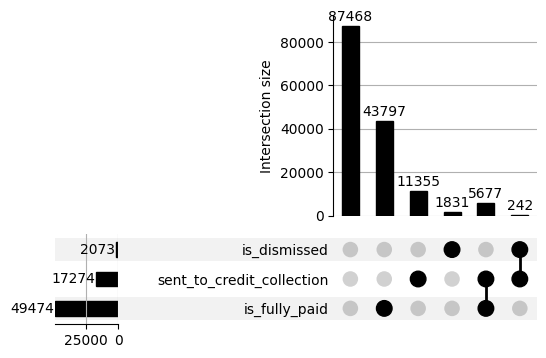

In [8]:
from upsetplot import UpSet, from_indicators

UpSet(from_indicators(['is_dismissed', 'is_fully_paid', 'sent_to_credit_collection'],
data=case_log),
show_counts=True).plot()

- *b) Observations from the Upset Plot*

1. **Intersection Analysis**:
   - The **largest intersection** contains **87,468 cases** where none of the outcomes (dismissed, fully paid, or sent to credit collection) overlap significantly. This indicates that the majority of cases have distinct outcomes without any overlap.
   - The next major intersection, with **43,797 cases**, shows cases that share only one specific outcome. This highlights that a considerable proportion of cases are associated with a singular outcome (like being fully paid or sent to credit collection) without overlap with other outcomes.
   - **Cases that are only dismissed** number **2,073**, which shows that case dismissal is a relatively rare event compared to other outcomes like being fully paid or sent to credit collection.
   - There are **11,355 cases** where two or more outcomes intersect, demonstrating a more complex relationship among case outcomes. These intersections may indicate specific scenarios where cases require more nuanced handling, such as when they are sent to credit collection and subsequently paid in full.

2. **Outcome-Specific Observations**:
   - **Cases Fully Paid**: There is a significant number of cases, **49,474 in total**, that are marked as fully paid. This indicates a high success rate in recovering payments. However, the analysis should consider whether these payments occurred voluntarily or as a result of enforcement actions, such as sending cases to credit collection.
   - **Credit Collection**: **17,274 cases** were sent to credit collection. This emphasizes the importance of enforcement processes in the case management system. It might be worthwhile to investigate the effectiveness of credit collection measures and any factors contributing to successful recovery.
   - **Dismissed Cases**: The number of dismissed cases, **2,073**, is much lower compared to other outcomes. This suggests that case dismissal is not a frequent outcome, and it may reflect either a stringent criteria for dismissal or a focus on pursuing cases until resolution through payment or credit collection.

3. **Implications and Recommendations**:
   - The plot provides a visual representation that is useful for understanding the relationships and relative frequencies of different outcomes. This can guide efforts to improve case management processes.
   - The substantial number of cases sent to credit collection implies that there is room to review and potentially optimize these processes. If a high proportion of cases sent to credit collection are not fully paid, it might be beneficial to explore alternative strategies for recovery.
   - Analyzing cases that are dismissed might offer insights into the reasons behind dismissals and whether any patterns or inefficiencies exist that could be addressed.
   - Lastly, for cases that are successfully fully paid, it could be insightful to determine what factors contribute to this success and if these factors can be leveraged for cases at risk of defaulting.




## Task 6


In [9]:
fig3 = px.scatter(case_log, x='initial_fine_amount', y='final_outstanding_payment', width=1700)

fig3.show()

#### Observations:
1. **Clustering for Low Fine Amounts**:
   - The data shows a dense clustering of cases where initial fines range from **0 to 500**. In this range, most cases have final outstanding balances close to zero or slightly above zero.
   - The density decreases as the initial fine amount increases, suggesting fewer cases with higher initial fines.

2. **Presence of Outliers**:
   - There are several outliers, particularly for initial fines exceeding **1,500**, where the final outstanding balances are significantly high (even over 5,000). These may indicate cases with accrued interest or unresolved payments.

3. **General Trend**:
   - An upward trend is visible, indicating that **higher initial fines tend to correlate with higher outstanding balances**. However, there is considerable variability, and the relationship is not perfectly linear.
   - This suggests that larger fines may be harder to settle, potentially due to financial constraints or case complexities.

4. **Negative Balances**:
   - A few cases exhibit negative outstanding balances, which could imply overpayments or data entry errors. This anomaly warrants further investigation to ensure data accuracy.

5. **Sparse Distribution Beyond 2,000**:
   - For initial fine amounts above **2,000**, the data points become sparse and widely scattered. This indicates fewer cases with such high fines, with outcomes that are more unpredictable.


## Task 7
- The employee with resource 29 handled 18% of all cases where the org:resource entry is not missing. This employee deducted a minimum of 2 points and a median of 5 points from offenders driving licences.

- 58/66 cases where 10 points (which is the highest amount in the log) where deducted from the offender, violated article number 142. After some research we found out that following article 142 10 points are deducted when exceeding speed limits by more than 60 km/h

# Session 3

## Task 1

- *a)* 
    - *Variant 1:* This process involves creating a fine, followed by a series of steps such as sending the fine, inserting a fine notification, adding a penalty, and finally sending the fine for credit collection.
    - *Variant 2:* This process is much shorter, involving creating a fine and then immediately payment within a short time.
    - *Variant 3:* This variant consists of creating a fine and then sending the fine with a significant delay.
    - *Variant 4:* This variant involves creating a fine, sending the fine with a delay, inserting a fine notification, adding a penalty and finally a payment by the offender.

    Unexpected behaviour:   
    - In variant 2 the fine is immediatly payed without it being sent, how is the offender informed about the violation?
    - In all the variants 1,3,4 the interval between fine creation and it being sent is mostly over 100 days, why does it take so long?

- *b)* 88.29% of all cases are covered by these variants.
- *c)* 
![DFG of four most frequent Variants](images/process_map.png)


## Task 2

- *a)* 
    - *Observation 1:* Out of the 79'860 fine notifications, only 3'891 are directly paid while 72'334 are added a penalty. This suggests that only about 4.9% of individuals pay their fines directly upon receiving a notification, while 90.6% of cases end up accruing penalties. This is an alarmingly low direct payment rate, raising concerns about the efficiency of the current system in prompting immediate compliance. Investigating the reasons for this low payment rate (e.g., communication issues, inability to pay, or lack of consequences for delays) could help improve the system and reduce the need for adding penalties and further administrative actions.

    - *Observation 2:* Most of the cases with added penalty are sent to credit collection and only a small part is paid directly. This suggests that the process of sending cases to credit collection is the primary mechanism used to resolve unpaid fines with added penalties, instead of direct payments. This heavy reliance on credit collection is likely a costly and resource-intensive process, involving legal and administrative fees, which could strain the system. It would be valuable to investigate whether measures can be taken to encourage earlier payments (e.g., reminders, incentives, flexible payment plans) before fines escalate to the collection stage. This could save resources and reduce the need for costly enforcement actions.

    - *Observation 3:* There is a surprisingly high number of cases (97,182) being sent to "Control Collection" after appeal actions. This suggests that many appeals are not being resolved in favor of the individual or that many cases are moving directly to enforcement, bypassing other steps. This might indicate inefficiencies in the appeal process, leading to excessive forwarding to collections or improper handling of appeals.

- *b)* Create Fine → Payment → Send Fine 
- *c)* This is quite difficult to answer but a possible explanation could be that the individual might have proactively paid the fine before the formal notification was sent. In some systems, people are aware of fines (for example, through online portals or informal communication), and they can pay them directly without waiting for the official fine letter.

## Task 3

<img src="images/repeated_activities.png" alt="Alt Text" style="width: 800px;"/>

- *a)* see the first column in the screenshot
- *b)* see the second column in the screenshot
- *c)* 
    - *2 occurences:* S92963


        Fine Issued and Notified: The fine was issued on June 27, 2004, for 68.25 units. It wasn’t sent to the person right away—it took until November 22, 2004 for the fine to be sent, and a formal notification was recorded on December 2, 2004.

        Penalty Added: On January 31, 2005, an additional penalty of 137.55 units was added to the case, increasing the total fine quite significantly. This penalty may have been added due to late action or non-payment by the due date.

        First Payment:The person made a first payment of 79.25 units on February 11, 2005, but this didn’t cover the full amount owed.

        Appeal to Judge: Instead of fully settling the case, the person decided to appeal to a judge on June 27, 2005. This likely indicates they weren’t happy with the fine or the added penalty and wanted to challenge it legally.

        Final Payment: On December 12, 2005, the person made a second and final payment of 148.55 units, likely closing out the case.
        
    - *5 occurences:*  V9576
    
        Fine Issuance and Notification: On July 31, 2002, the individual was fined an amount of 131.0 units for a traffic violation. A few months later, on October 25, 2002, the fine was officially sent to the individual, and by November 4, 2002, a notification regarding the fine was recorded in the system.

        Appeal Process: Rather than paying the fine immediately, the individual chose to appeal the fine. The appeal process began when the date of appeal to the prefecture was recorded on November 13, 2002, and the appeal was officially sent to the prefecture on December 2, 2002.

        Additional Penalty: On January 3, 2003, while the appeal was still under review, an additional penalty of 262.0 units was added to the original fine, which significantly increased the total amount owed.

        Appeal Result: The result of the appeal came back from the prefecture on February 28, 2003, and the individual was informed of the outcome on April 23, 2003. It seems that the appeal was unsuccessful because, soon after, on May 2, 2003, the individual escalated the matter further by appealing to a judge.
        
        Payments: Over the following year, the individual made six payments in multiple installments, starting on May 3, 2004 and ending on October 5, 2004. The payments gradually increased the amount settled, starting from 24.36 units and reaching a final total of 146.16 units by the end of the payment process.

## Task 4

The svg and bpmn files are in the files folder and can be downloaded by clicking the links below.


In [41]:
from IPython.display import display, HTML

# Create download links for BPMN and SVG files
html_content = """
<a href="files/RTFM-Template.bpmn" download>Download BPMN File</a><br>
<a href="files/diagram.svg" download>Download SVG File</a>
"""
display(HTML(html_content))


## Task 5

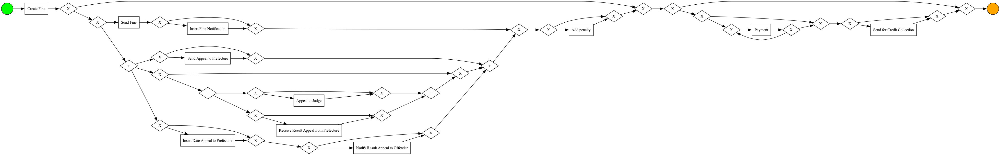

In [10]:
bpmn_model = pm4py.discover_bpmn_inductive(event_log, noise_threshold=0.1)
pm4py.view_bpmn(bpmn_model)

There are a number of traces that are not that common our handmade BPMN model covers the most usual traces only. Here are two traces of the generated model that are not present in our model from task 4.
 - We did not consider cases where the fine is not sent before being paid
 - We did not consider cases where the trace does not follow the strict sequence "Insert date appeal to prefecture -> Send Appeal to Prefecture -> Receive Result Appeal from Prefecture -> Notify Result Appeal to Offender". In the generated BPMN model, this actions can happen in any order.

# Session 4

## Task 1

|             | Statistics/Overview/Events over time                                                              | Statistics/Overview/Active cases over time            |
|-------------|---------------------------------------------------------------------------------------------------|-------------------------------------------------------|
| Observation | There appear to be somewhat periodic occurrences of comparably very high numbers of events/day.   | The appears to be some seasonality pattern.           |
| Question    | What causes these abnormaly high spikes?                                                          | What are the parameters that dictate the seasonality? |

## Task 2


In [11]:
df = pm4py.convert_to_dataframe(event_log)

# Ensure the 'time:timestamp' column is in datetime format
df['time:timestamp'] = pd.to_datetime(df['time:timestamp'])

# Filter the data to only include cases from the year 2000
df_2000 = df[df['time:timestamp'].dt.year == 2000]

# Extract the start time (the first event per case) for the year 2000
case_start_times = df_2000.groupby('case:concept:name')[
    'time:timestamp'].min().reset_index()

# Plot histogram of case start times
fig = px.histogram(case_start_times, x='time:timestamp', nbins=365, width=700)

# Update layout for better visuals
fig.update_layout(
    bargap=0.05,
    title="Case Arrivals in the Year 2000",
    xaxis_title="Start Time",
    yaxis_title="Number of Cases",
    # Format x-axis as day-month-year
    xaxis=dict(tickformat="%d-%m-%Y"),
)

# Show the plot
fig.show()

We observed the following patterns:

1. Seasonality:
 - There is a notable peak in case arrivals during the summer months, especially between June and September, with the highest spike observed in July. This could suggest yearly seasonality.
2.	Low activity at the beginning and end of the year:
 - The case arrivals are much lower in January and December compared to the middle of the year. This could indicate fewer activities (holidays, vacations) due to seasonal factors.

## Task 3

In [12]:
df['time:timestamp'] = pd.to_datetime(df['time:timestamp'])

# Extract the month and year from the 'time:timestamp' column
df['month'] = df['time:timestamp'].dt.month
df['year'] = df['time:timestamp'].dt.year

# Extract the first event for each case
case_start_times = df.groupby('case:concept:name')[
    'time:timestamp'].min().reset_index()

# Extract the month and year for the first event of each case
case_start_times['month'] = case_start_times['time:timestamp'].dt.month
case_start_times['year'] = case_start_times['time:timestamp'].dt.year

# Group by month and year to get the case arrival counts
monthly_case_counts = case_start_times.groupby(
    ['year', 'month']).size().reset_index(name='Number of Cases')

# Plot the distribution of case arrivals for each calendar month, grouped by year
fig = px.histogram(
    monthly_case_counts,
    x='month',
    y='Number of Cases',
    color='year',
    barmode='group',
    width=800,
    title="Case Arrivals per Month by Year"
)

# Update layout for better visuals
fig.update_layout(
    xaxis_title="Month",
    yaxis_title="Number of Cases",
    bargap=0.1,
    xaxis=dict(tickmode='array', tickvals=list(range(1, 13)), ticktext=[
        'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
)

# Show the plot
fig.show()

Across all years, we see a consistent pattern where case arrivals rise steadily from the beginning of the year and peak in the summer months, followed by a decline towards the end of the year. This seasonal pattern appears to be stable across most years, indicating a consistent monthly seasonality.

### Drift

We can observe drift that is consistent over all months of the years. Roughly speaking, the years 2000 to 2002 exhibit higher case arrivals per month compared to 2003-2005 when case arrivals appear to be lower throughout the year. The years 2005 to 2008 then again exhibit higher case arrivals before the case arrivals decline again in the following years.

### Outliers

There are some outliers in the year 2004. While in the early months case arrivals are lower compared to other years, they are much higher in the summer nonths of July and August. There are other outliers such as the year 2005 which shows signigicantly more case arrivals than usual in the late months of the year.

## Task 4

In [22]:
from event_enricher_v3 import create_case_log, event_add_ordered_case_id

case_log = create_case_log(event_log)
event_log = event_add_ordered_case_id(event_log, case_log)

filtered_case_log = case_log.sort_values(by='start_time')
filtered_case_log = filtered_case_log[:110]
filtered_event_log = event_log[event_log['case:concept:name'].isin(
    filtered_case_log.index)]

bar_size = pd.Timedelta(hours=8)
fig = px.timeline(
    filtered_event_log,
    x_start=(filtered_event_log['time:timestamp'] + bar_size),
    x_end=filtered_event_log['time:timestamp'],
    y='ordered_case_id',
    color='concept:name',
    height=700  
)

# Adjust axes to improve readability
fig.update_yaxes(categoryorder='category descending')
fig.update_layout(
    xaxis_title='Timestamp',
    yaxis_title='Ordered Case ID',
    xaxis=dict(side='top'),
    yaxis=dict(side='left')
)

# Set the x-axis range to only include the first half of the year 2000
fig.update_xaxes(
    range=["2000-01-01", "2001-06-30"]
)

# Add scatter plot for points, because the points from the dotted chart where almost invisible
for activity in filtered_event_log['concept:name'].unique():
    activity_data = filtered_event_log[filtered_event_log['concept:name'] == activity]
    fig.add_scatter(
        x=activity_data['time:timestamp'] + bar_size,
        y=activity_data['ordered_case_id'],
        mode='markers',
        marker=dict(size=10, line=dict(width=2)),
        name=activity,  # Show activity name in the legend
        marker_color=px.colors.qualitative.Plotly[filtered_event_log['concept:name'].unique().tolist().index(activity)],
        showlegend=True if filtered_event_log['concept:name'].tolist().count(activity) == 1 else False
    )


fig.show()


### Observations from the Dotted Chart

1. **Event Clustering**:  
   The events for each case are clustered close together, indicating that multiple activities related to a case are typically executed within a relatively short time period. This suggests that once a case is initiated, the associated processes are handled in quick succession without significant delays between events.

2. **Event Variety Across Cases**:  
   There is noticeable variation in the types of events occurring for different cases. While some cases have multiple distinct event types (represented by different colored dots), others have fewer events. This may imply differences in case complexity or variations in how cases are processed.


## Task 5

<img src="images/sesh4-task5.png" alt="Disco absolute time distribution filtered for 'send fine' and 'send for credit collection'" style="width: 1000px;"/>

### Observations

We can observe large spikes in the timeline and smaller, more frequent spikes. The 'Send for Credit Collection' corresponds to the large spikes in the timeline. The distribution for this activity is not continuous and not really spaced evenly over time. The smaller, frequent spikes correspond to the 'Send Fine' activity. They are more continuous and more evenly spaced.

### Interpretation

The distribution of 'Send for Credit Collection' suggests that this activity is being performed in batch processing, where cases accumulate over time and get processed in bulk in a more or less periodic manner. In contrast the frequent and ongoing distribution of 'Send Fine' implies that fines are being issued on a more regular consistent basis, potentially in small batches. The large peaks for “Send for Credit Collection” could indicate potential bottlenecks in the process, especially if many cases are being processed in a single go, which could overwhelm resources or slow down other parts of the workflow.

### See the plots below for more insights

In [23]:
activities_of_interest = ['Send for Credit Collection', 'Send Fine']
filtered_events = event_log[event_log['concept:name'].isin(activities_of_interest)].copy()

# Extract date and activity
filtered_events['date'] = filtered_events['time:timestamp'].dt.date

# Plot the distributions
for activity in activities_of_interest:
    activity_events = filtered_events[filtered_events['concept:name'] == activity]
    fig = px.histogram(activity_events, x='time:timestamp', nbins=100, title=f"Time Distribution for {activity}")
    fig.update_layout(xaxis_title='Timestamp', yaxis_title='Number of Events')
    fig.show()

## Task 6

## Task 7

In [100]:
import numpy as np
import pandas as pd
import plotly.express as px


def calculate_delays(event_log, subprocess):
    cases_with_subprocess = event_log.groupby('case:concept:name').filter(
        lambda x: set(subprocess).issubset(set(x['concept:name']))
    )
    delays = {f"{subprocess[i]} to {subprocess[i+1]}": []
              for i in range(len(subprocess) - 1)}

    for case_id, group in cases_with_subprocess.groupby('case:concept:name'):
        group = group.sort_values('time:timestamp')
        activity_times = group.loc[group['concept:name'].isin(
            subprocess), ['concept:name', 'time:timestamp']]
        activity_times = activity_times.drop_duplicates(
            subset='concept:name').set_index('concept:name')

        for i in range(len(subprocess) - 1):
            activity_a, activity_b = subprocess[i], subprocess[i + 1]
            if {activity_a, activity_b}.issubset(activity_times.index):
                time_a = activity_times.loc[activity_a]['time:timestamp']
                time_b = activity_times.loc[activity_b]['time:timestamp']
                delay_days = (time_b - time_a).total_seconds() / 86400
                delays[f"{activity_a} to {activity_b}"].append(delay_days)

    return delays


subprocess_S1 = ['Create Fine', 'Send Fine', 'Insert Fine Notification',
                 'Add penalty', 'Send for Credit Collection']
subprocess_S2 = ['Insert Date Appeal to Prefecture', 'Send Appeal to Prefecture',
                 'Receive Result Appeal from Prefecture', 'Notify Result Appeal to Offender']

delays_S1 = calculate_delays(event_log, subprocess_S1)
delays_S2 = calculate_delays(event_log, subprocess_S2)


def plot_delays(delays, subprocess_name):
    for transition, delay_values in delays.items():
        if delay_values:
            fig = px.histogram(delay_values, nbins=50, title=f"{transition} ({subprocess_name})",
                               labels={'value': 'Delay (days)'})
            fig.update_layout(xaxis_title='Delay (days)',
                              yaxis_title='Frequency')
            fig.show()
        else:
            print(f"No data for {transition} in {subprocess_name}")


plot_delays(delays_S1, 'S1')
plot_delays(delays_S2, 'S2')

transition = 'Send Fine to Insert Fine Notification'
send_fine_delays = delays_S1.get(transition, [])

if send_fine_delays:
    median_delay = np.median(send_fine_delays)
    print(f"The median transit time for '{
          transition}' is {median_delay:.2f} days.")
else:
    print(f"No delay data found for the transition: {transition}")

The median transit time for 'Send Fine to Insert Fine Notification' is 16.00 days.


### a)
- Credit collection is only initiated at least 200 days after a penalty is added, with some cases delayed by over 3000 days.
- Sending a fine notification can take over 400 days in rare cases, showing this step isn’t automated and can face significant delays.
- Most fines are sent within 150 days of creation, with few taking longer.
- Some appeal processes show negative delays, which likely indicates data errors, as results shouldn’t be received before appeals are sent.
- Most appeals are processed promptly, some cases show extreme delays, up to 1800 days, in forwarding appeals.

### b)

Penalty addition appears to be automated.

### c)

All of the processes that are 'triggered notifications' could be automated.
- receive result appeal
- send appeal
- insert date appeal

### d)

160 days as there are few outliers after 160 days.

### e)

The median transit time is 16 days.

# Session 5

## Task 1

- *a)* Condition to check: "Insert Fine Notification is always followed by Add penalty."


In [24]:
declare_model_a = {'response': {('Insert Fine Notification', 'Add penalty'): None}}
conf_result_a = pm4py.conformance_declare(event_log, declare_model_a, return_diagnostics_dataframe=True)
# Filter for cases that have at least one deviation (i.e., where the response constraint is violated)
non_conforming_cases_a = conf_result_a[conf_result_a['no_dev_total'] > 0]

negatives = conf_result_a[conf_result_a['dev_fitness'] < 1.0]
print('Rule A - Fitness:', conf_result_a['dev_fitness'].mean(), 'Violations:', len(negatives))
display(negatives[['case_id','dev_fitness']].head(5))

Rule A - Fitness: 1.0 Violations: 0


,case_id,dev_fitness



- *b)* Condition to check: "Insert Date Appeal to Prefecture is always preceded by Send Fine."


In [25]:
declare_model_b = {'precedence': {('Send Fine', 'Insert Date Appeal to Prefecture'): None}}
conf_result_b = pm4py.conformance_declare(event_log, declare_model_b, return_diagnostics_dataframe=True)
violations_b = conf_result_b[conf_result_b['dev_fitness'] < 1.0]

# Display the results
print('Rule B - Fitness:', conf_result_b['dev_fitness'].mean(), 'Violations:', len(violations_b))
display(violations_b[['case_id', 'dev_fitness']].head(5))

Rule B - Fitness: 0.9998536942209217 Violations: 22


,case_id,dev_fitness
21524,A5922,0.0
22246,A7016,0.0
23958,C11327,0.0
24346,C12875,0.0
24938,C14313,0.0



There are 22 cases violating this precedence constraint. one of them is A5922. This case has the following sequence of actions: 

Create Fine -> Insert Date Appeal to Prefecture -> Send Fine -> Insert Fine -> Notification -> Add penalty -> Send Appeal to Prefecture

Since "Insert Date Appeal to Prefecture" happens before "Send Fine", this case violates the rule. The sequence does not follow the expected order of events where the fine should have been sent before any appeal-related action was recorded.

- *c)* Condition to check: "Payment and Send for Credit Collection do not occur together in a case."

In [26]:
declare_model_c = {'not_coexistence': {('Payment', 'Send for Credit Collection'): None}}
conf_result_c = pm4py.conformance_declare(event_log, declare_model_c, return_diagnostics_dataframe=True)
violations_c = conf_result_c[conf_result_c['dev_fitness'] < 1.0]

# Display the results
print('Rule C - Fitness:', conf_result_c['dev_fitness'].mean(), 'Violations:', len(violations_c))
display(violations_c[['case_id', 'dev_fitness']].head(5))

Rule C - Fitness: 1.0 Violations: 0


,case_id,dev_fitness



    
## Task 2
"Send Fine" is always preceded by "Create Fine"


In [27]:
declare_model = {'precedence': {('Create Fine', 'Send Fine'): None}}
conf_result = pm4py.conformance_declare(event_log, declare_model, return_diagnostics_dataframe=True)
violations = conf_result_b[conf_result_b['dev_fitness'] < 1.0]

# Display the results
print('Rule B - Fitness:', conf_result['dev_fitness'].mean(), 'Violations:', len(violations))
display(violations[['case_id', 'dev_fitness']].head(5))

Rule B - Fitness: 1.0 Violations: 22


,case_id,dev_fitness
21524,A5922,0.0
22246,A7016,0.0
23958,C11327,0.0
24346,C12875,0.0
24938,C14313,0.0


It would make sense that a fine has to be created before it can be sent, but in 22 cases this doesn't apply. In most these cases this is because the fine is not sent directly after being created but "Insert date appeal to prefecture" happens in between.

## Task 3
First we need to convert the BPMN model from 3.5 to Petri Net

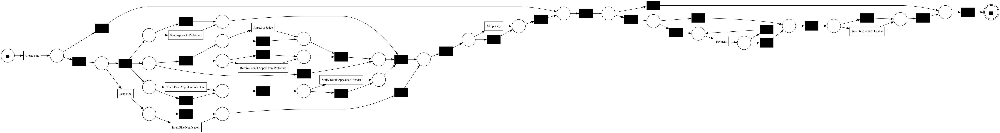

In [28]:
(pn, im, fm) = pm4py.objects.conversion.bpmn.variants.to_petri_net.apply(bpmn_model, parameters=None)
pm4py.view_petri_net(pn, im, fm)


Now we can calculate the fitness of the Event Log against the Petri Net using token-based replay.

In [29]:
display(pm4py.fitness_token_based_replay(event_log, pn, im, fm))
display(pm4py.fitness_alignments(event_log, pn, im, fm))

replaying log with TBR, completed traces :: 100%|██████████| 231/231 [00:00<00:00, 250.51it/s]


{'perc_fit_traces': 93.9628915342156,
 'average_trace_fitness': 0.9942540127458663,
 'log_fitness': 0.993434068861363,
 'percentage_of_fitting_traces': 93.9628915342156}

aligning log, completed variants :: 100%|██████████| 231/231 [00:02<00:00, 114.54it/s]


{'percFitTraces': 93.9628915342156,
 'averageFitness': 0.9870661806910803,
 'percentage_of_fitting_traces': 93.9628915342156,
 'average_trace_fitness': 0.9870661806910803,
 'log_fitness': 0.9799163026722675}


Next we check for deviations from the model by creating alignments and printing those with fitness less than 1.0. It helps identify which specific events in the log do not conform to the Petri net.

In [30]:
diagnostics = pm4py.conformance_diagnostics_alignments(event_log, pn, im, fm)
# Loop through diagnostic results to find non-conforming traces
for idx, item in enumerate(diagnostics):
    if item['fitness'] < 1.0:  # Non-conforming trace
        # Retrieve case ID from the event log using the index (idx)
        case_id = event_log['case:concept:name'].unique()[idx]  # Case ID based on the trace index
        
        print(f"\nNon-conforming Trace Found (Case ID: {case_id}) with Fitness: {item['fitness']}")
        print("Alignment:")
        for (log_move, model_move) in item['alignment']:
            print(f"Log move: {log_move} ; Model move: {model_move}")

        # Extract the corresponding trace from the event log for inspection
        non_conforming_trace = event_log[event_log['case:concept:name'] == case_id]
        print(f"Non-conforming Trace Events (Case ID: {case_id}):")
        print(non_conforming_trace[['case:concept:name', 'concept:name', 'time:timestamp']])
        
        # Optionally break after the first violating trace, or keep looping for more
        break

aligning log, completed variants :: 100%|██████████| 231/231 [00:02<00:00, 111.63it/s]



Non-conforming Trace Found (Case ID: A10001) with Fitness: 0.7142857142857143
Alignment:
Log move: Create Fine ; Model move: Create Fine
Log move: >> ; Model move: None
Log move: Send Fine ; Model move: Send Fine
Log move: Insert Fine Notification ; Model move: Insert Fine Notification
Log move: Insert Date Appeal to Prefecture ; Model move: >>
Log move: >> ; Model move: None
Log move: >> ; Model move: None
Log move: Add penalty ; Model move: Add penalty
Log move: Send Appeal to Prefecture ; Model move: >>
Log move: >> ; Model move: None
Log move: >> ; Model move: None
Log move: >> ; Model move: None
Log move: >> ; Model move: None
Non-conforming Trace Events (Case ID: A10001):
   case:concept:name                      concept:name  \
12            A10001                       Create Fine   
13            A10001                         Send Fine   
14            A10001          Insert Fine Notification   
15            A10001  Insert Date Appeal to Prefecture   
16            A10001  


### a) Case ID: A10001 Process Steps

For **Case ID: A10001**, the process followed these steps:

1. **Create Fine** (2007-03-19)
2. **Send Fine** (2007-07-17)
3. **Insert Fine Notification** (2007-07-25)
4. **Insert Date Appeal to Prefecture** (2007-08-02)
5. **Add Penalty** (2007-09-23)
6. **Send Appeal to Prefecture** (2007-09-24)

#### Deviations:
When comparing this trace to the BPMN model, we found several deviations:

- There are points where the process did something unexpected, represented by `>>` in the log. For example, the model didn't anticipate the event **"Insert Date Appeal to Prefecture"** at that point.
  
- The most significant issue is that the **appeal was sent after the penalty** had already been added. This doesn't seem correct, as typically, the appeal should be sent **before** the penalty is applied.


### b) Is the variant expected or unexpected?

This behavior is **unexpected**. Typically, an appeal should be raised **before** a penalty is applied. The fact that the penalty was added first, and then the appeal was sent, suggests that something went wrong.

#### ii. If the variant is unexpected, explain the behavior:

Looking more closely at the case:

- The **penalty** was added on **2007-09-23**, which is almost **two months** after the appeal was **inserted** on **2007-08-02**.
- However, the **appeal wasn’t sent** until **2007-09-24**, which was **after** the penalty had already been applied.

This sequence doesn't make sense, as appeals should usually prevent penalties if they are handled correctly and in time.

---

### Interpretation of the unexpected behavior:

The most likely explanation is a **delay in processing the appeal**. Either the appeal wasn’t processed on time, or there was a mix-up, causing the penalty to be added **before** the appeal was properly sent. This may point to issues in how the process manages appeals, leading to **delays or errors** that result in penalties being applied prematurely.


## Task 4

### a) Steps to Check Log Conformance for:
#### " If the outstanding balance after the event is 0 or less, then there is no further event.":

1. **Iterate through the log** and group by `case:concept:name`.
2. For each case, track the `outstanding_balance` after every event.
3. Once the balance reaches **0 or less**, check if any additional events are logged.
4. **Report violations** (cases where further events occurred after the balance was zero or negative).

In [31]:
def check_outstanding_balance_conformance(event_log):
    # Dictionary to store violating cases
    violating_cases = []
    
    # Grouping events by case ID
    grouped_cases = event_log.groupby('case:concept:name')

    # Iterate over each case
    for case_id, events in grouped_cases:
        events = events.sort_values(by='time:timestamp')  # Sorting events by time
        balance_breached = False  # Flag to check if balance breached before
        
        # Check each event in the case
        for idx, event in events.iterrows():
            outstanding_balance = event['outstanding_balance']
            
            # If balance <= 0 and there are more events, record violation
            if outstanding_balance <= 0:
                balance_breached = True
            elif balance_breached:
                # If more events occurred after balance became 0 or less, report violation
                violating_cases.append(case_id)
                break  # No need to check further events in this case
    
    return violating_cases

# Check conformance
violating_cases = check_outstanding_balance_conformance(event_log)

# Display the first 5 violating case IDs
print("First 5 violating cases:", violating_cases[:5])

# Display the total number of violating cases
print("Total violating cases:", len(violating_cases))

# Display the Fuzzy Truth Value
print("Fuzzy Truth Value:", (len(event_log)-len(violating_cases))/len(event_log))

First 5 violating cases: ['A10125', 'A1161', 'A12260', 'A127', 'A1308']
Total violating cases: 579
Fuzzy Truth Value: 0.99896877838531



### Violation Summary:

- **579 cases** violate the statement: 
  - "If the outstanding balance after the event is 0 or less, then there is no further event."
  
- **Fuzzy Truth Value**: 0.999

#### Example of One Violating Case:
- **Case ID**: A10125

#### Explanation:
- The offender pays 49 for the fine amount and expenses. The outstanding balance is temporarely 0. Then a further event happens, a penalty of 79 is added. This violates the statement.
#%% md
### b) Steps to Check Log Conformance for: 
#### "An appeal to the prefecture must be raised 60 days after Insert Fine Notification or earlier":

1. **Identify** the `Insert Fine Notification` event for each case.
2. **Identify** the event related to raising the appeal (`Insert Date Appeal to Prefecture`).
3. **Calculate** the time difference between `Insert Fine Notification` and the appeal event.
4. **Check** if the appeal was raised within **60 days** after the fine notification.
5. **Report violations** where the appeal was raised after the **60-day limit**.


In [32]:
def check_appeal_timing(event_log):
    # Dictionary to store violating cases
    violating_cases = []

    # Group events by case ID
    grouped_cases = event_log.groupby('case:concept:name')

    # Iterate over each case
    for case_id, events in grouped_cases:
        events = events.sort_values(by='time:timestamp')  # Sorting events by time
        notification_time = None
        appeal_time = None

        # Iterate over each event in the case
        for idx, event in events.iterrows():
            event_name = event['concept:name']
            event_time = event['time:timestamp']

            # Look for 'Insert Fine Notification'
            if event_name == 'Insert Fine Notification':
                notification_time = event_time
            
            # Look for appeal-related events (replace 'Insert Date Appeal to Prefecture ' with the actual event name)
            if event_name == 'Insert Date Appeal to Prefecture':
                appeal_time = event_time

        # If both notification and appeal were found, check the time difference
        if notification_time and appeal_time:
            time_difference = (appeal_time - notification_time).days

            # If appeal was raised after 60 days, mark as violation
            if time_difference > 60:
                violating_cases.append({
                    'case_id': case_id,
                    'notification_time': notification_time,
                    'appeal_time': appeal_time,
                    'days_after_notification': time_difference
                })
    
    return violating_cases

# Run the conformance check for appeal timing
violations = check_appeal_timing(event_log)

# Display the first 5 violating cases
print("First 5 violating cases:")
for violation in violations[:5]:
    print(f"Case ID: {violation['case_id']}, Days After Notification: {violation['days_after_notification']}")

# Display the total number of violating cases
print("Total violating cases:", len(violations))

# Display the Fuzzy Truth Value
print("Fuzzy Truth Value:", (len(event_log)-len(violations))/len(event_log))

First 5 violating cases:
Case ID: A10102, Days After Notification: 65
Case ID: A10249, Days After Notification: 100
Case ID: A10338, Days After Notification: 72
Case ID: A10495, Days After Notification: 70
Case ID: A10625, Days After Notification: 62
Total violating cases: 582
Fuzzy Truth Value: 0.9989634352681355


### Violation Summary:

- **582 cases** violate the statement: 
  - "An appeal to the prefecture must be raised 60 days after Insert Fine Notification or earlier."
  
- **Fuzzy Truth Value**: 0.9989634352681355

#### Example of One Violating Case:
- **Case ID**: A10102
  - **Insert Fine Notification**: 2007-07-07 00:00:00+00:00
  - **Insert Date Appeal to Prefecture**: 2007-09-10 00:00:00+00:00
  - **Time Difference**: 65 days (which is **5 days more** than allowed).

#### Explanation:
- The offender likely appealed against the fine as a reaction to an **added penalty** on **2007-09-05 00:00:00+00:00**, just **5 days before** the appeal was made.


# Session 6
## Task 1
Explanation Hypothesis: If the police fail to send the fine letter within the legally defined deadline (360 days),
Then the case will not be "credit collected."

In [ ]:
# Define the legal deadline in days
LEGAL_DEADLINE_DAYS = 360

# Step 1: Collect unique case names and initialize a DataFrame for outcomes
unique_cases = event_log['case:concept:name'].unique()
case_outcomes_df = pd.DataFrame({'case:concept:name': unique_cases})

# Identify cases that were marked for credit collection
credit_cases = event_log[event_log['concept:name'] == 'Send for Credit Collection']['case:concept:name'].unique()
case_outcomes_df['credit_collected'] = case_outcomes_df['case:concept:name'].isin(credit_cases)

# Determine which cases were not collected for credit
case_outcomes_df['not_credit_collected'] = ~case_outcomes_df['credit_collected']

# Step 2: Gather relevant event timestamps for deadline evaluation
send_fine_records = event_log[event_log['concept:name'] == 'Send Fine']
create_fine_records = event_log[event_log['concept:name'] == 'Create Fine']

# Extract the earliest 'Create Fine' timestamp for each case
create_fine_dates = create_fine_records.groupby('case:concept:name')['time:timestamp'].min().reset_index()
create_fine_dates.columns = ['case:concept:name', 'create_fine_time']

# Extract the earliest 'Send Fine' timestamp for each case, if available
send_fine_dates = send_fine_records.groupby('case:concept:name')['time:timestamp'].min().reset_index()
send_fine_dates.columns = ['case:concept:name', 'send_fine_time']

# Step 3: Combine the two timestamps and compute delays
merged_case_times = pd.merge(create_fine_dates, send_fine_dates, on='case:concept:name', how='left')
merged_case_times['send_fine_delay'] = (merged_case_times['send_fine_time'] - merged_case_times['create_fine_time']).dt.total_seconds() / (3600 * 24)

# Handle cases where 'Send Fine' did not occur
merged_case_times.loc[merged_case_times['send_fine_time'].isna(), 'send_fine_delay'] = None

# Determine if the fine letter was sent within the legal deadline
merged_case_times['fine_sent_within_deadline'] = merged_case_times['send_fine_delay'] <= LEGAL_DEADLINE_DAYS

# Cases without a 'Send Fine' are considered as not sent within the deadline
merged_case_times['fine_sent_within_deadline'].fillna(False, inplace=True)

# Step 4: Integrate outcome data with the explanation results
case_outcomes_df = pd.merge(case_outcomes_df, merged_case_times[['case:concept:name', 'fine_sent_within_deadline']], on='case:concept:name')

# Determine if the explanation holds: fine was not sent within the deadline
case_outcomes_df['explanation_applies'] = ~case_outcomes_df['fine_sent_within_deadline']

# Step 5: Count True Positives, False Positives, and False Negatives
true_positives = case_outcomes_df[(case_outcomes_df['explanation_applies']) & (case_outcomes_df['not_credit_collected'])].shape[0]
false_positives = case_outcomes_df[(case_outcomes_df['explanation_applies']) & (~case_outcomes_df['not_credit_collected'])].shape[0]
false_negatives = case_outcomes_df[(~case_outcomes_df['explanation_applies']) & (case_outcomes_df['not_credit_collected'])].shape[0]

# Calculate precision and recall metrics
precision_value = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
recall_value = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0

# Print the final results
print(f"Precision: {precision_value:.4f}")
print(f"Recall: {recall_value:.4f}")
print(f"False Positives: {false_positives}")

### Evaluation of Explanation Metrics

- **Precision**: The precision of the explanation is calculated as **0.9995**. This indicates that when the explanation applies, there is a 99.95% chance that the case is indeed not sent for credit collection. A high precision means that there are very few false positives.

- **Recall**: The recall is calculated as **0.5079**, suggesting that the explanation correctly identifies about 50.79% of the cases that were not sent for credit collection. This means that while the explanation is precise when it applies, it may not cover a significant portion of the total cases.

- **False Positives**: There are **21** false positives, which means that in these cases, the explanation incorrectly indicated that the fine was not sent within the deadline when, in fact, it was sent.

### Conclusion
The metrics suggest that while the explanation is highly precise, its recall is relatively low, indicating that many cases that should be flagged are not being captured by the explanation criteria. 

## Task 2
- *a)* 


In [ ]:
# Step 1: Filter cases that only have the exact sequence ['Create Fine', 'Send Fine']
filtered_cases = event_log.groupby('case:concept:name').filter(
    lambda x: set(x['concept:name']) == {'Create Fine', 'Send Fine'} and len(x) == 2
)['case:concept:name'].unique()

# Step 2: Determine the outcome for each case
# Outcome is True if 'Send for Credit Collection' is NOT in the case's events
credit_collection_cases = set(event_log[event_log['concept:name'] == 'Send for Credit Collection']['case:concept:name'])
case_outcomes = pd.DataFrame({'case:concept:name': event_log['case:concept:name'].unique()})
case_outcomes['not_credit_collected'] = ~case_outcomes['case:concept:name'].isin(credit_collection_cases)

# Step 3: Count True Positives, False Positives, and False Negatives
case_outcomes['explanation_applies'] = case_outcomes['case:concept:name'].isin(filtered_cases)

# True Positives (TP): Explanation applies and outcome is 'Not Credit Collected'
TP = case_outcomes[(case_outcomes['explanation_applies']) & (case_outcomes['not_credit_collected'])].shape[0]

# False Positives (FP): Explanation applies but outcome is 'Credit Collected'
FP = case_outcomes[(case_outcomes['explanation_applies']) & (~case_outcomes['not_credit_collected'])].shape[0]

# False Negatives (FN): Explanation does not apply but outcome is 'Not Credit Collected'
FN = case_outcomes[(~case_outcomes['explanation_applies']) & (case_outcomes['not_credit_collected'])].shape[0]

# Step 4: Calculate precision and recall
precision = TP / (TP + FP) if (TP + FP) > 0 else 0
recall = TP / (TP + FN) if (TP + FN) > 0 else 0

# Print results
print("Precision:", precision)
print("Recall:", recall)


- *b)* 

In [ ]:
from sklearn.metrics import precision_score, recall_score

# Filter dismissal events and exclude null values
dismissals_data = event_log[['case:concept:name', 'dismissal']].dropna()

# Identify dismissals tied to variant cases, excluding '#' and 'G'
variant_case_dismissals = dismissals_data[
    (dismissals_data['case:concept:name'].isin(filtered_cases)) & (~dismissals_data['dismissal'].isin(['#', 'G']))
]
variant_dismissals_set = set(variant_case_dismissals['dismissal'])

# Identify dismissals for non-variant cases, excluding '#' and 'G'
non_variant_case_dismissals = dismissals_data[
    (~dismissals_data['case:concept:name'].isin(filtered_cases)) & (~dismissals_data['dismissal'].isin(['#', 'G']))
]
non_variant_dismissals_set = set(non_variant_case_dismissals['dismissal'])

# Find unique dismissals associated only with variant cases
exclusive_variant_dismissals = variant_dismissals_set - non_variant_dismissals_set

# Calculate precision and recall scores
case_outcome = event_log['case:concept:name'].isin(filtered_cases)
dismissal_explanation = event_log['dismissal'].isin(exclusive_variant_dismissals)
precision = precision_score(case_outcome, dismissal_explanation, pos_label=True, zero_division=1)
recall = recall_score(case_outcome, dismissal_explanation, pos_label=True, zero_division=1)

# Compute the number of cases captured by this explanation
recalled_cases_count = recall * case_outcome.sum()

print(f"Precision: {precision}")
print(f"Maximal set of dismissal values: {exclusive_variant_dismissals}")
print(f"Recalled cases count: {recalled_cases_count}")

# Analytics Lists

## Interesting Findings
- The median of the initial fine amount is very distant from the maximum, in fact only 9 entries have an initial fine amount of over 900. 


## Process Improvements 
- All the missing values in the amount and payment columns turned out to be a hurdle for addition and other multiplications so we replaced them with 0.

## Open Questions
- Why are so many cases closed even if the final outstanding payment is not equal to 0?
- Cases with high initial fines and outstanding balances might need a closer examination to understand factors leading to non-payment, such as financial hardship or legal challenges.
- Why are there negative balances?